# Import des données, packages et librairies

In [ ]:
# Import packages
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import altair as alt
import panel as pn

import warnings
warnings.filterwarnings('ignore')

# Please enter PATH to the directory containing the dpt2020.csv file
# PATH = 'data/'
PATH = r"/content/drive/MyDrive/TelecomParis/IGR204_Dataviz/Miniprojet1/data/"
primary_color = "#0072B5"
secondary_color = "#94EA84"

In [ ]:
# If working on colab :
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import working database
df = pd.read_csv(PATH + "dpt2020.csv", delimiter=";")
df = df.rename(columns={'preusuel': 'prenom', 'annais': 'annee'})

# Gender

## Processing

In [ ]:
df_gender = df[(df["annee"]!="XXXX")&(df["prenom"]!="_PRENOMS_RARES")]
df_gender["annee"] = df_gender["annee"].astype(int)
df_gender.loc[df_gender["sexe"]==1, "sexe"] = "male"
df_gender.loc[df_gender["sexe"]==2, "sexe"] = "female"
df_gender = df_gender.groupby(by=["sexe", "prenom", "annee"])["nombre"].sum().reset_index() # pas besoin des départements
df_gender = df_gender.pivot(index=["prenom", "annee"], columns=["sexe"], values=["nombre"])["nombre"].reset_index()
df_gender[["male", "female"]] = df_gender[["male", "female"]].fillna(0)
df_gender["both"]=df_gender["male"] + df_gender["female"]
df_gender[["male","female", "both"]] = df_gender[["male","female", "both"]].astype(int)
df_gender["perc_male"] = df_gender["male"]/df_gender["both"]
df_gender["perc_female"] = df_gender["female"]/df_gender["both"]
df_gender["perc_mixed"] = df_gender[["perc_male", "perc_female"]].min(axis=1)
df_gender["mixed"] = df_gender["perc_mixed"]>0
df_gender["male_century"] = df_gender.groupby("prenom")["male"].transform("sum")
df_gender["female_century"] = df_gender.groupby("prenom")["female"].transform("sum")
df_gender["both_century"] = df_gender["female_century"] + df_gender["male_century"]
df_gender["perc_mixed_century"] = df_gender[["male_century",	"female_century"]].min(axis=1)/df_gender["both_century"]
year_index = pd.Index(np.arange(df_gender["annee"].min(), df_gender["annee"].max()), name="annee")
firstName_index = pd.Index(df_gender["prenom"].unique(), name="prenom")
df_gender = df_gender.set_index(["prenom", "annee"])
new_index = pd.MultiIndex.from_product([firstName_index, year_index])
df_gender = df_gender.reindex(new_index).reset_index()
print(df_gender.dtypes)
df_gender.head()

sexe
prenom                 object
annee                   int64
female                float64
male                  float64
both                  float64
perc_male             float64
perc_female           float64
perc_mixed            float64
mixed                  object
male_century          float64
female_century        float64
both_century          float64
perc_mixed_century    float64
dtype: object


sexe,prenom,annee,female,male,both,perc_male,perc_female,perc_mixed,mixed,male_century,female_century,both_century,perc_mixed_century
0,AADIL,1900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AADIL,1901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AADIL,1902,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AADIL,1903,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AADIL,1904,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
def get_interesting_names(df_gender, min_perc_mixed_century = 0, min_both_century = 0, max_perc_mixed_century=np.inf, min_perc_mixed=0):
    mask = (df_gender["perc_mixed_century"]>=min_perc_mixed_century) & (df_gender["both_century"]>=min_both_century) \
            & (df_gender["perc_mixed"]>=min_perc_mixed) & (df_gender["perc_mixed_century"]<=max_perc_mixed_century)
    return df_gender.loc[mask, :]

# example
get_interesting_names(df_gender, min_perc_mixed_century = 0, min_both_century = 0, max_perc_mixed_century=np.inf, min_perc_mixed=0.1)
get_interesting_names(df_gender, min_perc_mixed_century = 0, min_both_century = 0, max_perc_mixed_century=np.inf, min_perc_mixed=0.1)["prenom"].unique()
get_interesting_names(df_gender, min_perc_mixed_century = 0, min_both_century = 0, max_perc_mixed_century=np.inf, min_perc_mixed=0.1)["prenom"].drop_duplicates().sample(n=2)

1480722    ROSALIE
14929         ABEL
Name: prenom, dtype: object

## Viz

### Background
We separate the background rendering from the 

In [ ]:
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import pickle

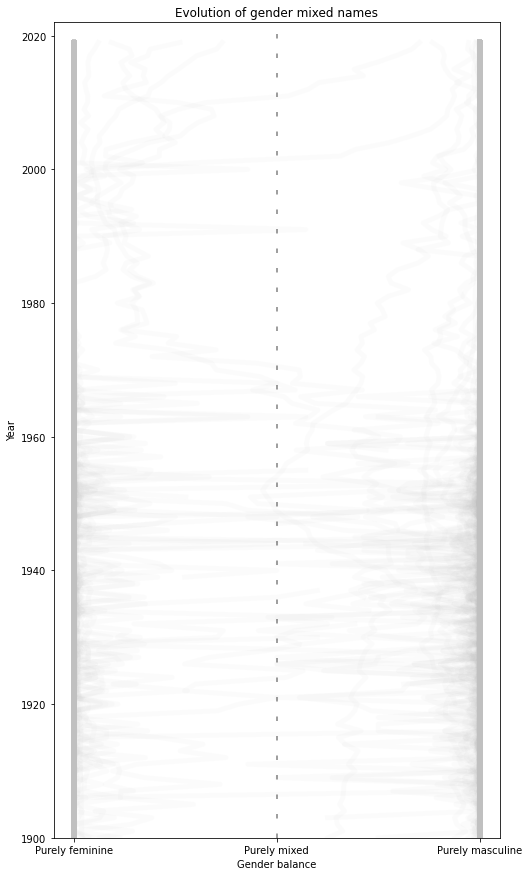

In [ ]:
# fig layout

def generate_background(df_gender, n, firstname_list=[]):
    fig, ax = plt.subplots(1,1, figsize = (8,15))
    ax.set_xlim(-1.1, 1.1) #Setting x limits on our axis
    ax.set_ylim(1900, 2022) #Setting x limits on our axis
    if len(firstname_list)==0:
        samples = df_gender["prenom"].drop_duplicates().sample(n=n).values
    else:
        samples = firstname_list[:n]
    for prenom in samples:
        x = 2 * df_gender[df_gender["prenom"]==prenom]["perc_male"] - 1
        y = df_gender[df_gender["prenom"]==prenom]["annee"]
        ax.plot(x, y, c = "silver", alpha = 0.05, linewidth=5)
    
    plt.xlabel("Gender balance")
    plt.ylabel("Year")
    plt.title("Evolution of gender mixed names")
    ax.set_xticks([-1,0,1])
    ax.set_xticklabels(["Purely feminine", "Purely mixed", "Purely masculine"])
    ax.axvline(0, linestyle = (0, (3, 10, 3, 10)) , c='black', alpha = 0.5)
    return fig, ax

top_prenom_century = df_gender.sort_values(by="both_century", ascending=False)["prenom"].drop_duplicates().values
figure_background, ax = generate_background(df_gender, 500, top_prenom_century)


In [ ]:
# needs to be in a separate cell so that there is no interference between plot and state of figure
with open('fig_background.pickle', 'wb') as handle:
    pickle.dump((figure_background, ax), handle, protocol=pickle.HIGHEST_PROTOCOL)

Next we will define a scale to map number of baby named every year to linewidth

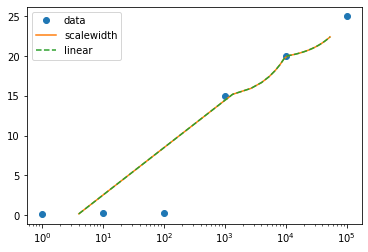

In [18]:
from scipy.interpolate import interp1d
x = [1, 10, 100, 1000, 10000, 100000]
y = [0.1, 0.2, 0.3, 15, 20, 25]
scaleLineWidth = interp1d(x, y, kind = 'linear')
f2 = interp1d(x, y, kind='linear')
xnew = np.linspace(4, df_gender["both"].max(), num=41, endpoint=True)
plt.plot(x, y, 'o', xnew, scaleLineWidth(xnew), '-', xnew, f2(xnew), '--')
plt.legend(['data', 'scalewidth', 'linear'], loc='best')
# plt.yscale("log")
plt.xscale("log")
plt.show()

### Play-Time !

First try to run a few times the second cell to gain some understanding on how the viz works. Then feel free to try some other parameters on the first cell !

In [19]:
# You choose the kind of names you want to see, if  

numberOfLines = 6 # the number of lines you want to see runing on the graph, be careful if you are too restrictive on other criteria, there might not be enough lines
min_perc_mixed_century = 0.05 # minimum percentage of gender balance over the last century, a high percentage will yield names that are commonly given to both sexes
max_perc_mixed_century=np.inf # same for maximum percentage of gender balance
min_both_century = 10000 # the minimum number of babies that have been named, the lower, the more exotic names can pop up !
min_perc_mixed=0.3 # at least one year was mixed up to this percentage for the name

In [20]:
success = False
while not(success):
    if numberOfLines == 0:
        raise ValueError("You are definitely too restrictive, no first name matches your criteria")
    try :
        interesting_names = get_interesting_names(df_gender, min_perc_mixed_century = min_perc_mixed_century, min_both_century = min_both_century, max_perc_mixed_century=max_perc_mixed_century, min_perc_mixed=min_perc_mixed)["prenom"].drop_duplicates().sample(n=numberOfLines).values
        success = True
    except :
        print("Unfortunately, you criteria are too restrictive for the number of lines specified !\n Trying again with : {} lines instead of {}".format(numberOfLines-1, numberOfLines))
        numberOfLines -= 1

print("I found some interesting names ! Wait and see...")

df = df_gender[df_gender["prenom"].isin(interesting_names)]
df = pd.pivot(df[["prenom", "annee", "perc_male", "both"]], index="annee", columns="prenom", values=["perc_male", "both"])

with open('fig_background.pickle', 'rb') as handle:
    figure, ax = pickle.load(handle)

colors = plt.cm.rainbow(np.linspace(0, 1, numberOfLines))
lines = [ax.plot(0, 0, c=c, lw=0)[0] for c in colors] #preemptively plotting our line at it's starting point. We will define line in our function
l = lines[0]
y = []

annotations = [ax.annotate(prenom, xy=(0,0), xytext=(0,0), c = c) for prenom, c in zip(interesting_names, colors)]

def animate(i, df):
    for k, (prenom, l, c, annot) in enumerate(zip(interesting_names, lines, colors, annotations)):
        x = list(2*df["perc_male"][prenom].values[:i]-1)
        y = list(df.index.values[:i])
        l.set_xdata(x)
        l.set_ydata(y)
        ax.fill_betweenx(np.array(y),np.array(x), np.array(x)+0.002*scaleLineWidth(df["both"][prenom].values[:i]),color=c,alpha=.5)
        if len(x)>=1:
            annot.set_position((x[-1], y[-1] + 1 * (k - numberOfLines/2)))
            annot.xy = (x[-1], y[-1])
    return lines
    
ani = animation.FuncAnimation(figure, animate, frames = np.arange(len(df)), fargs=(df,), repeat = False)

HTML(ani.to_jshtml())

I found some interesting names ! Wait and see...
